val_log_loss: 0.0006293860699494955
val_f1: 0.999871451713587
val_accuracy: 0.9998714515265131
val_precision: 0.9998714849499704
val_recall: 0.9998714515265131
val_auc: 0.9999928536564062


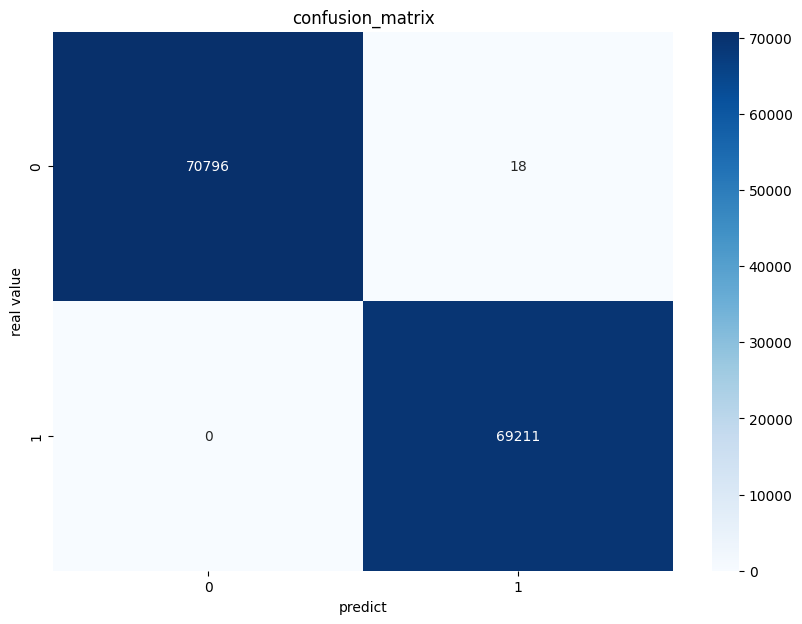

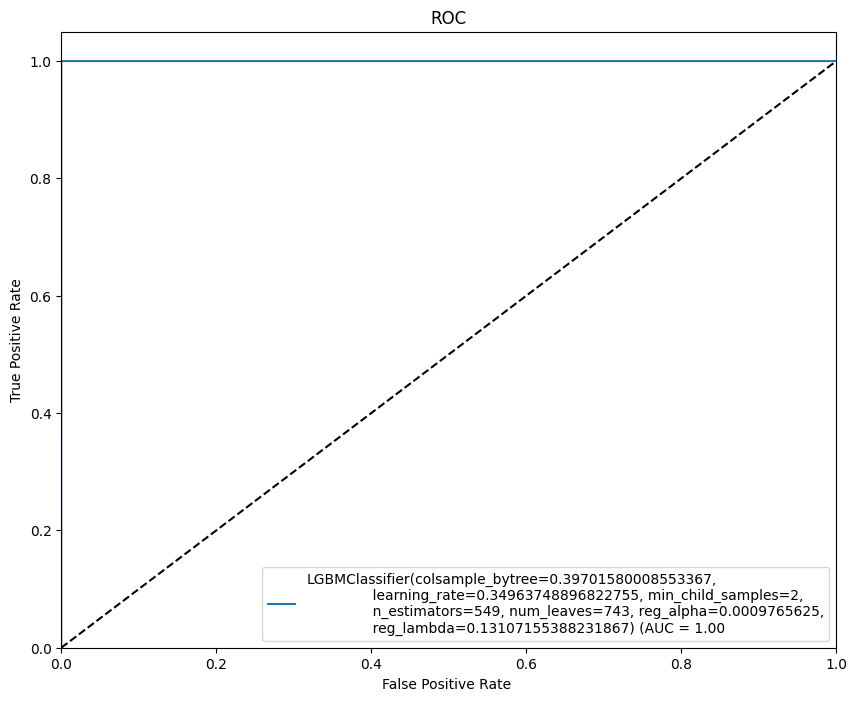

Cross-validation accuracy: 0.9999 ± 0.0000
分类报告:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     70814
           1       1.00      1.00      1.00     69211

    accuracy                           1.00    140025
   macro avg       1.00      1.00      1.00    140025
weighted avg       1.00      1.00      1.00    140025

模型:lightgbm
交叉验证f1: [0.99981943 0.99991572 0.99986757 0.99981942 0.99983146]
平均f1: 0.999850722330593


In [1]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np
import lightgbm as lgbm

# 绘制混淆矩阵
def plot_confusion_matrix(y_true, y_pred, labels):
    cm = confusion_matrix(y_true, y_pred)  # 计算混淆矩阵
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)  # 绘制热力图
    plt.xlabel('predict value')
    plt.ylabel('real value')
    plt.title('confusion_matrix')
    plt.show()

# 绘制ROC曲线
def plot_roc_curve():
    plt.figure(figsize=(10, 8))
    y_pred_proba = model.predict_proba(X_val)[:, 1]  # 预测概率
    fpr, tpr, _ = roc_curve(y_val, y_pred_proba)  # 计算假阳性率和真阳性率
    roc_auc = auc(fpr, tpr)  # 计算AUC
    plt.plot(fpr, tpr, label=f'{model} (AUC = {roc_auc:.2f})')  # 绘制ROC曲线
    plt.plot([0, 1], [0, 1], 'k--')  # 绘制对角线
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate ')
    plt.ylabel('True Positive Rate')
    plt.title('ROC曲线')
    plt.legend(loc='lower right')
    plt.show()

# 评估模型得分
def eval_score(y_val, y_pred, y_proba=None):
    val_loss = log_loss(y_val, y_proba)  # 计算对数损失
    val_f1 = f1_score(y_val, y_pred, average='weighted')  # 计算F1得分
    val_accuracy = accuracy_score(y_val, y_pred)  # 计算准确率
    val_precision = precision_score(y_val, y_pred, average='weighted')  # 计算精确率
    val_recall = recall_score(y_val, y_pred, average='weighted')  # 计算召回率
    if y_proba.shape[1] > 1:
        num_classes = y_proba.shape[1]
        val_auc_roc = 0.0
        for class_idx in range(num_classes):
            val_auc_roc += roc_auc_score((y_val == class_idx).astype(int), y_proba[:, class_idx])
        val_auc_roc /= num_classes
    else:
        val_auc_roc = roc_auc_score(y_val, y_proba)  # 计算AUC得分
    return {
        "val_log_loss": val_loss,
        "val_f1": val_f1,
        "val_accuracy": val_accuracy,
        "val_precision": val_precision,
        "val_recall": val_recall,
        "val_auc": val_auc_roc,
    }

target_name = "Class"
replace_str = [':', '[', ']', '（', '）', '！', '＠', '＃', '￥', '％', '…', '《', '》', '【', '】', ' ']
for s in target_name:
    if s in replace_str:
        target_name = target_name.replace(s, '_')

train, validation = pd.read_csv("E:\\model2\\信用卡诈骗3_train.csv"), pd.read_csv("E:\\model2\\信用卡诈骗3_validation.csv")
validation = validation[train.columns]

X_train, y_train = train.drop(columns=target_name), train[target_name]
X_val, y_val = validation.drop(columns=target_name), validation[target_name]

params = {
    "reg_alpha": 0.0009765625,
    "num_leaves": 743,
    "reg_lambda": 0.13107155388231867,
    "n_estimators": 549,
    "learning_rate": 0.34963748896822755,
    "colsample_bytree": 0.39701580008553367,
    "min_child_samples": 2
}

model = lgbm.LGBMClassifier(**params)  # 初始化LightGBM模型
model.fit(X_train, y_train)  # 训练模型

pred = model.predict(X_val)  # 预测验证集
proba = model.predict_proba(X_val)  # 预测概率

model_res = eval_score(y_val, pred, proba)  # 评估模型

for k, v in model_res.items():
    print(f"{k}: {v}")

labels = y_val.unique()
plot_confusion_matrix(y_val, pred, labels)  # 绘制混淆矩阵
plot_roc_curve()  # 绘制ROC曲线

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_results = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')
print(f'交叉验证准确率: {cv_results.mean():.4f} ± {cv_results.std():.4f}')
print("分类报告:\n", classification_report(y_val, pred))  # 打印分类报告

scores = cross_val_score(model, X_train, y_train, cv=5, scoring='f1')
print("模型: lightgbm")
print("交叉验证F1:", scores)
print("平均F1:", np.mean(scores))


模型: Logistic Regression
最好的参数: {'C': 0.1}
混淆矩阵:
 [[68761  2053]
 [ 4394 64817]]
分类报告:
               precision    recall  f1-score   support

           0       0.94      0.97      0.96     70814
           1       0.97      0.94      0.95     69211

    accuracy                           0.95    140025
   macro avg       0.95      0.95      0.95    140025
weighted avg       0.95      0.95      0.95    140025

交叉验证f1: [0.97491213 0.94738136 0.92832678 0.96306229 0.89030884]
平均f1得分: 0.9407982813328871
交叉验证得分: 0.9440 ± 0.0260
模型: Random Forest
最好的参数: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2}
混淆矩阵:
 [[70693   121]
 [  199 69012]]
分类报告:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     70814
           1       1.00      1.00      1.00     69211

    accuracy                           1.00    140025
   macro avg       1.00      1.00      1.00    140025
weighted avg       1.00      1.00      1.00    140025

交叉验证f1: 

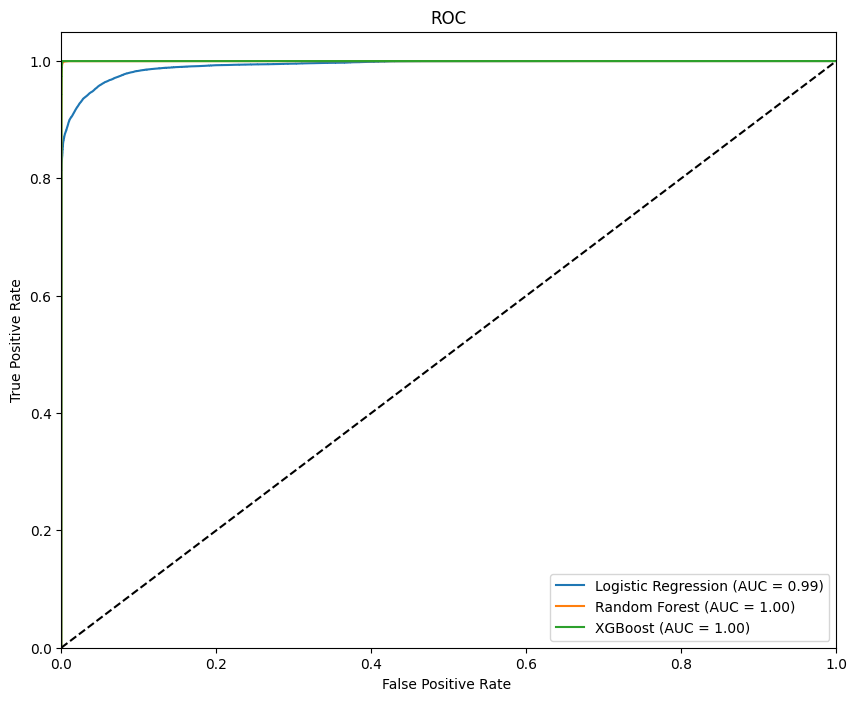

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc
from sklearn.cluster import MiniBatchKMeans
from xgboost import XGBClassifier

# 定义目标变量名称并替换特殊字符
target_name = "Class"
replace_str = [':', '[', ']', '（', '）', '！', '＠', '＃', '￥', '％', '…', '《', '》', '【', '】', ' ']
for s in replace_str:
    target_name = target_name.replace(s, '_')

# 读取训练集和验证集数据
train, validation = pd.read_csv("E:\\model2\\信用卡诈骗3_train.csv"), pd.read_csv("E:\\model2\\信用卡诈骗3_validation.csv")
validation = validation[train.columns]

# 分割特征和目标变量
X_train, y_train = train.drop(columns=target_name), train[target_name]
X_val, y_val = validation.drop(columns=target_name), validation[target_name]

# 使用MiniBatchKMeans进行数据采样
n_clusters = 1000
kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42, max_iter=100, n_init=10)
kmeans.fit(X_train)

# 选择每个聚类中的一部分样本
sampled_indices = []
for cluster in range(n_clusters):
    cluster_indices = np.where(kmeans.labels_ == cluster)[0]
    sampled_indices.extend(np.random.choice(cluster_indices, size=len(cluster_indices)//10, replace=False))

X_train = X_train.iloc[sampled_indices]
y_train = y_train.iloc[sampled_indices]

# 定义模型及其超参数
models = {
    'Logistic Regression': {
        'model': LogisticRegression(max_iter=1000),
        'params': {
            'C': [0.01, 0.1, 0.25]
        }
    },
    'Random Forest': {
        'model': RandomForestClassifier(),
        'params': {
            'max_depth': [10, 20, 30],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }
    },
    'XGBoost': {
        'model': XGBClassifier(),
        'params': {
            'n_estimators': [50, 100, 200],
            'max_depth': [6, 8, 10],
            'learning_rate': [0.01, 0.1, 0.2],
            'subsample': [0.5, 0.7, 1.0],
            'colsample_bytree': [0.5, 0.7, 1.0]
        }
    }
}

# 进行网格搜索和模型评估
for name, model in models.items():
    grid_search = GridSearchCV(model['model'], model['params'], cv=3, scoring='f1', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    models[name]['best_model'] = grid_search.best_estimator_
    y_pred = grid_search.predict(X_val)
    scores = cross_val_score(model['best_model'], X_train, y_train, cv=5, scoring='f1')
    print(f"模型: {name}")
    print("最好的参数:", grid_search.best_params_)
    print("混淆矩阵:\n", confusion_matrix(y_val, y_pred))
    print("分类报告:\n", classification_report(y_val, y_pred))
    print("交叉验证f1:", scores)
    print("平均f1得分:", np.mean(scores))
    cv_results = cross_val_score(model['best_model'], X_train, y_train, cv=5, scoring='accuracy')
    print(f'交叉验证得分: {cv_results.mean():.4f} ± {cv_results.std():.4f}')

# 绘制所有模型的ROC曲线
plt.figure(figsize=(10, 8))
for name, model in models.items():
    y_pred_proba = model['best_model'].predict_proba(X_val)[:, 1]
    fpr, tpr, _ = roc_curve(y_val, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc='lower right')
plt.show()

e:\python\Lib\site-packages\featuretools\entityset\entity.py:462: UserWarning: index index not found in dataframe, creating new integer column
  warnings.warn("index {} not found in dataframe, creating new "
e:\python\Lib\site-packages\featuretools\synthesis\dfs.py:307: UnusedPrimitiveWarning: Some specified primitives were not used during DFS:
  trans_primitives: ['divide', 'max_func', 'min_func', 'multiply', 'square']
This may be caused by a using a value of max_depth that is too small, not setting interesting values, or it may indicate no compatible variable types for the primitive were found in the data.
  warnings.warn(warning_msg, UnusedPrimitiveWarning)
C:\Users\17703\AppData\Local\Temp\ipykernel_24556\1828757206.py:132: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe =

            Time        V1        V2        V3        V4        V5        V6  \
index                                                                          
0      -1.996583 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388   
1      -1.996583  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361   
2      -1.996562 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499   
3      -1.996562 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203   
4      -1.996541 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921   
...          ...       ...       ...       ...       ...       ...       ...   
568625  1.084762 -0.125056  2.797045 -6.436962  3.250654 -1.673880 -2.737504   
568626 -0.637311 -3.352917  0.753401 -1.698278  0.863169 -1.186314 -0.406322   
568627 -1.301187  0.341900  1.691419 -1.741040  3.690779 -0.817104 -0.767287   
568628  1.060474 -1.269532  4.185133 -6.113043  5.037080  1.080631 -2.122858   
568629  0.485418 -4.623207  3.077593 -6.

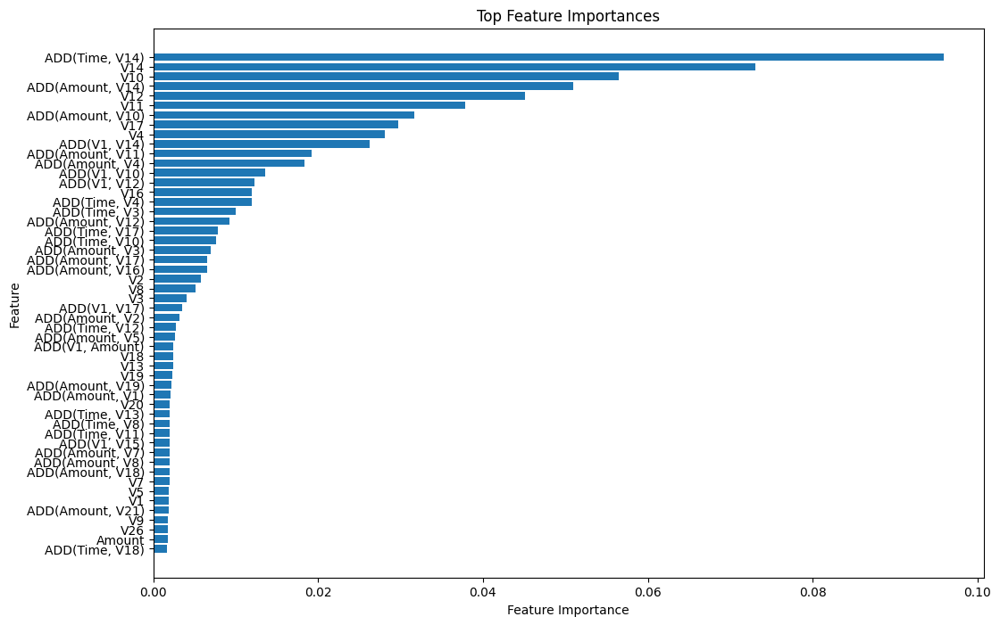

In [4]:
# 使用Featuretools进行特征工程
import featuretools as ft
import pandas as pd
import numpy as np
from featuretools.primitives import AggregationPrimitive, TransformPrimitive
from featuretools.variable_types import Numeric, Categorical, Boolean
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# 自定义聚合和转换操作
class AggMin(AggregationPrimitive):
    name = "agg_min"
    input_types = [Numeric]
    return_type = Numeric

    def get_function(self):
        return np.min

class AggMax(AggregationPrimitive):
    name = "agg_max"
    input_types = [Numeric]
    return_type = Numeric

    def get_function(self):
        return np.max

class AggMean(AggregationPrimitive):
    name = "agg_mean"
    input_types = [Numeric]
    return_type = Numeric

    def get_function(self):
        return np.mean

class Entropy(AggregationPrimitive):
    name = "entropy"
    input_types = [Categorical]
    return_type = Numeric

    def get_function(self):
        def entropy_func(series):
            value, counts = np.unique(series, return_counts=True)
            return entropy(counts, base=2)
        return entropy_func

class Combine(TransformPrimitive):
    name = "combine"
    input_types = [Categorical, Categorical]
    return_type = Categorical

    def get_function(self):
        return lambda x, y: x.astype(str) + y.astype(str)

class MinFunc(TransformPrimitive):
    name = "min_func"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        return np.minimum

class MaxFunc(TransformPrimitive):
    name = "max_func"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        return np.maximum

class Residual(TransformPrimitive):
    name = "residual"
    input_types = [Numeric]
    return_type = Numeric

    def get_function(self):
        return lambda x: x - x.astype(int)

class Add(TransformPrimitive):
    name = "add"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        return np.add

class Subtract(TransformPrimitive):
    name = "subtract"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        return np.subtract

class Multiply(TransformPrimitive):
    name = "multiply"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        return np.multiply

class Divide(TransformPrimitive):
    name = "divide"
    input_types = [Numeric, Numeric]
    return_type = Numeric

    def get_function(self):
        def safe_divide(x, y):
            return np.divide(x, y, out=np.zeros_like(x), where=y!=0)
        return safe_divide

class Square(TransformPrimitive):
    name = "square"
    input_types = [Numeric]
    return_type = Numeric

    def get_function(self):
        return np.square

# 读取数据并创建DataFrame
data = pd.read_csv(r'E:\\model2\\creditcard_resampled.csv')
df = pd.DataFrame(data)
target = df.pop('Class')

# 创建实体集并进行特征工程
es = ft.EntitySet(id="data")
es = es.entity_from_dataframe(entity_id="data", dataframe=df, index="index", make_index=False)
new_columns = []

feature_matrix, feature_defs = ft.dfs(entityset=es, target_entity="data", max_depth=1, max_features=100,
                                      trans_primitives=[MinFunc, MaxFunc, Add, Multiply, Divide, Square])
for col in feature_matrix.columns:
    new_columns.append(feature_matrix[col])
final_df = pd.concat([df] + new_columns, axis=1)
final_df['Class'] = target
print(feature_matrix)

# 分割特征和目标变量
X = final_df.drop(columns=['Class'])
X = X.drop(columns=['index'])
y = final_df['Class']

# 训练随机森林模型
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X, y)

# 绘制特征重要性
importances = model.feature_importances_
feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top_features = feature_importances.head(68)

plt.figure(figsize=(12, 8))
plt.barh(top_features['feature'], top_features['importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top Feature Importances')
plt.gca().invert_yaxis()
plt.show()

# 选择重要特征进行进一步分析
selected_features = top_features['feature'].values
final_df_top = final_df[selected_features]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

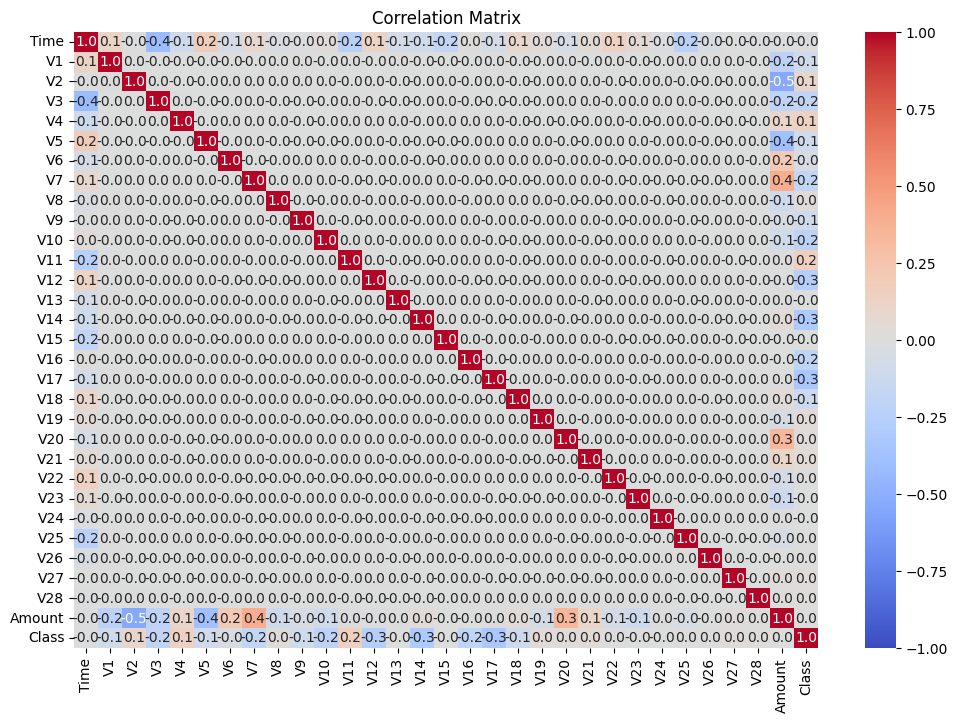

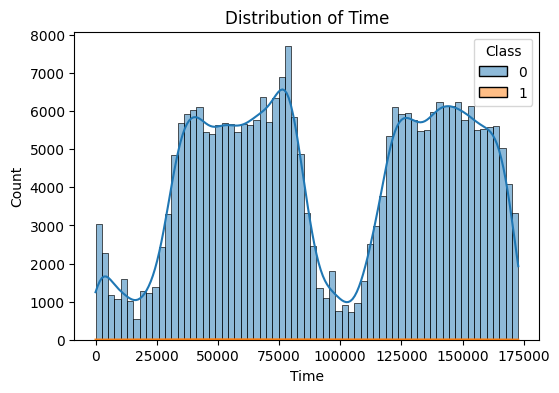

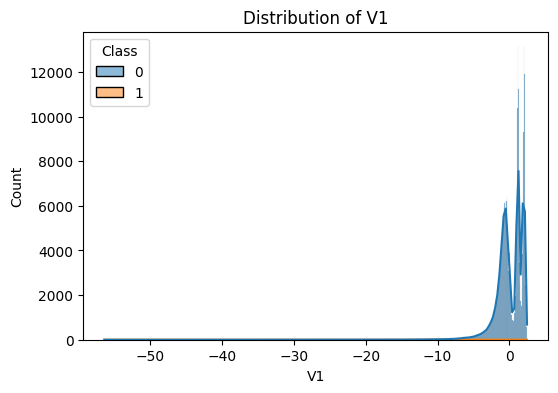

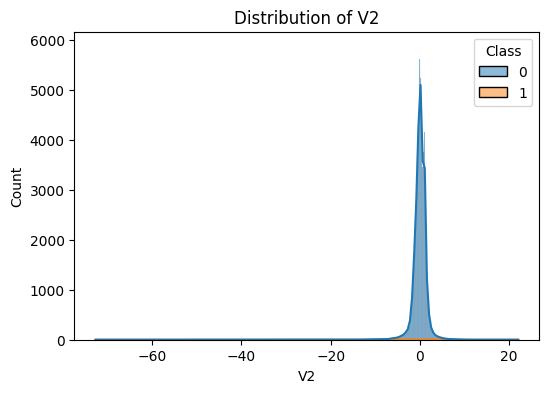

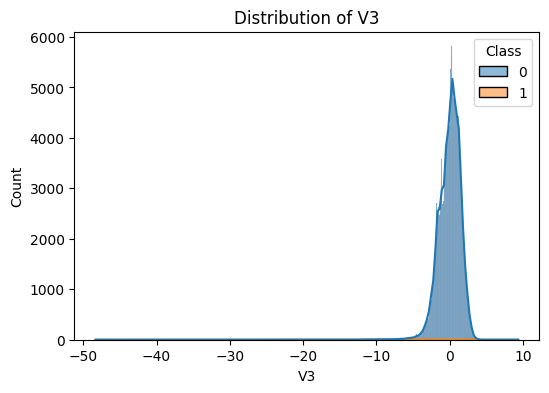

...

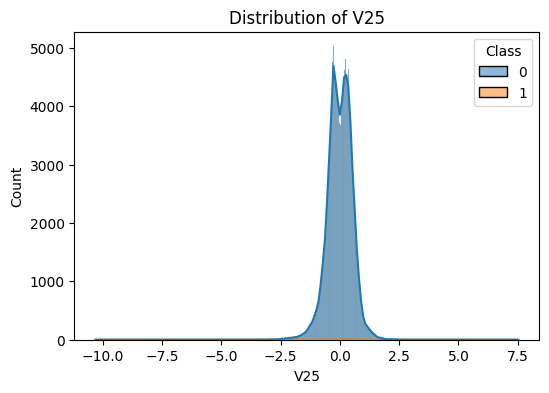

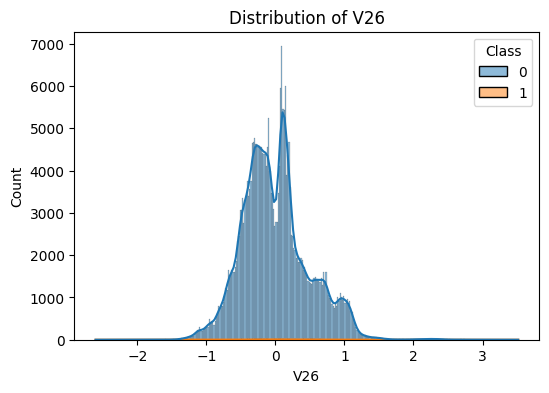

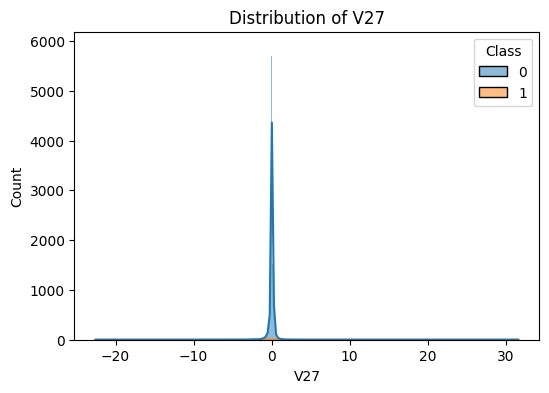

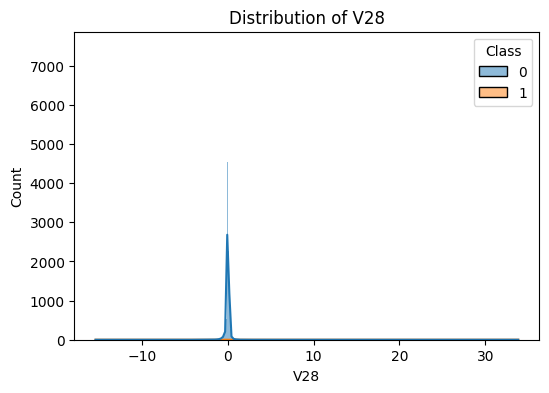

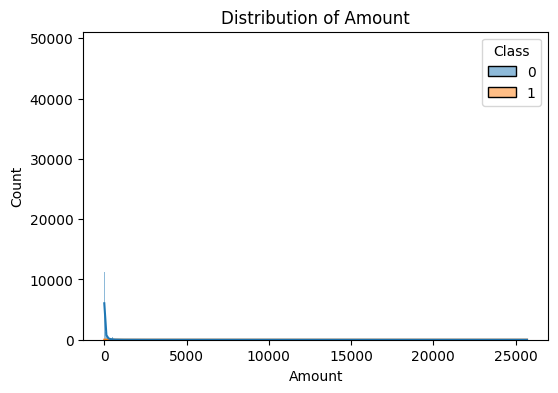

In [5]:
# 读取数据进行进一步分析和可视化
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "E:\\creditcard4.csv"
df = pd.read_csv(file_path)

# 显示数据基本信息和缺失值统计
print(df.info())
print(df.isnull().sum())

# 绘制特征分布
def plot_distribution(data, feature, target):
    plt.figure(figsize=(6, 4))
    sns.histplot(data=data, x=feature, hue=target, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

features = df.columns.drop('Class')

# 绘制相关矩阵
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.1f')
plt.title('Correlation Matrix')
plt.show()

# 绘制每个特征的分布图
class_data = df[df['Class'] == 1]
non_class_data = df[df['Class'] == 0]

for tmp in features:
    plot_distribution(df, tmp, "Class")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568630 entries, 0 to 568629
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    568630 non-null  float64
 1   V1      568630 non-null  float64
 2   V2      568630 non-null  float64
 3   V3      568630 non-null  float64
 4   V4      568630 non-null  float64
 5   V5      568630 non-null  float64
 6   V6      568630 non-null  float64
 7   V7      568630 non-null  float64
 8   V8      568630 non-null  float64
 9   V9      568630 non-null  float64
 10  V10     568630 non-null  float64
 11  V11     568630 non-null  float64
 12  V12     568630 non-null  float64
 13  V13     568630 non-null  float64
 14  V14     568630 non-null  float64
 15  V15     568630 non-null  float64
 16  V16     568630 non-null  float64
 17  V17     568630 non-null  float64
 18  V18     568630 non-null  float64
 19  V19     568630 non-null  float64
 20  V20     568630 non-null  float64
 21  V21     56

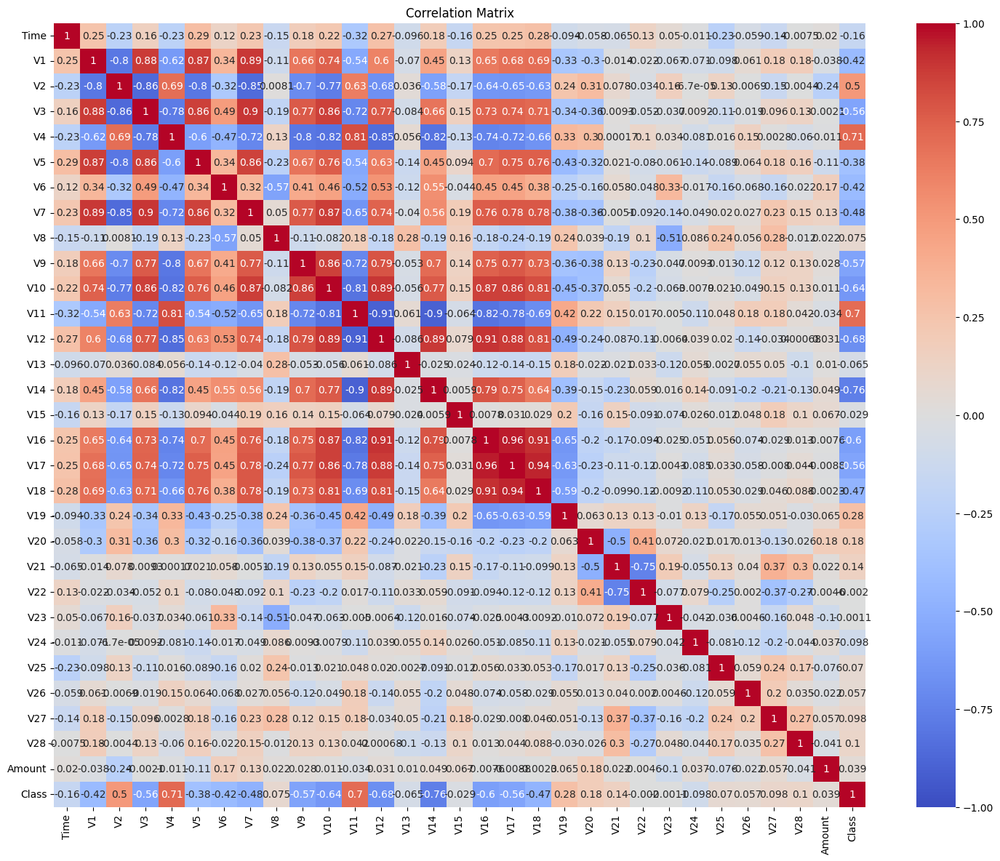

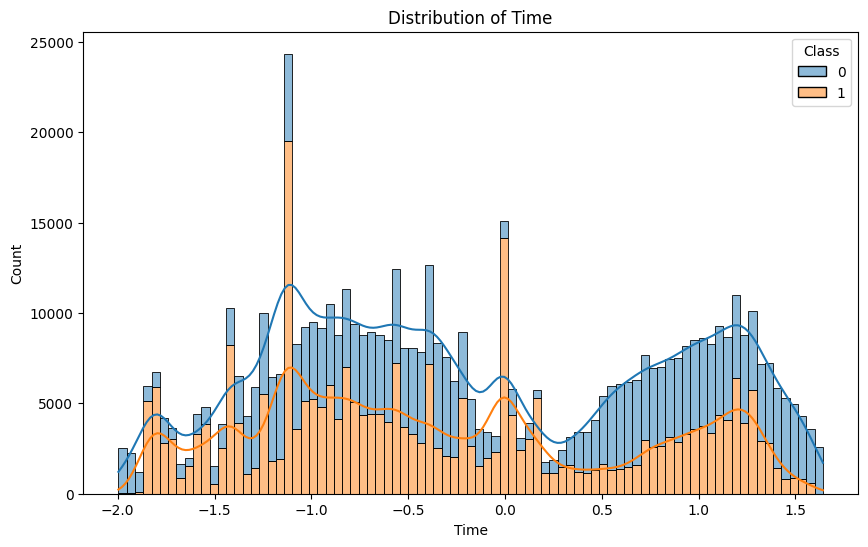

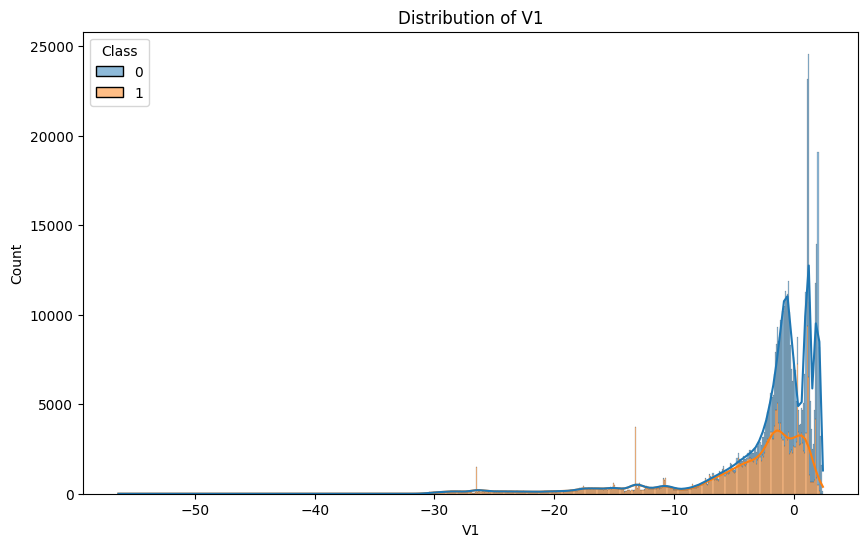

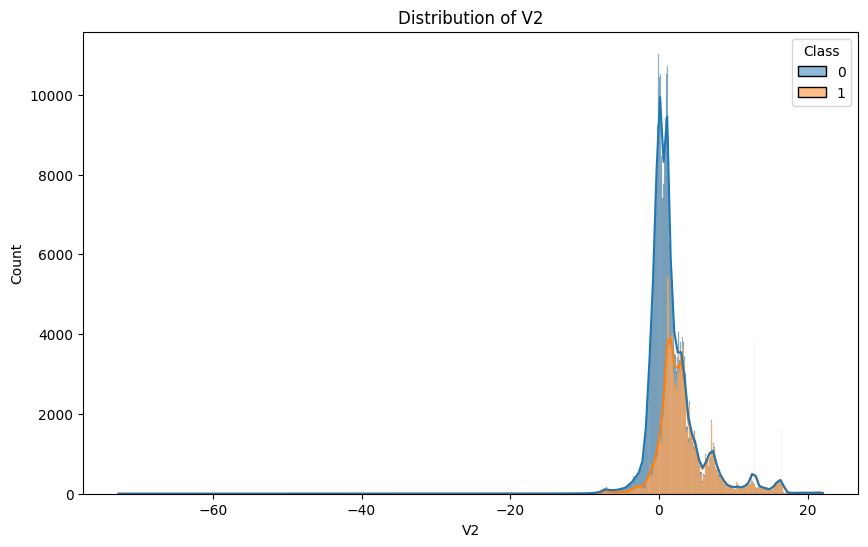

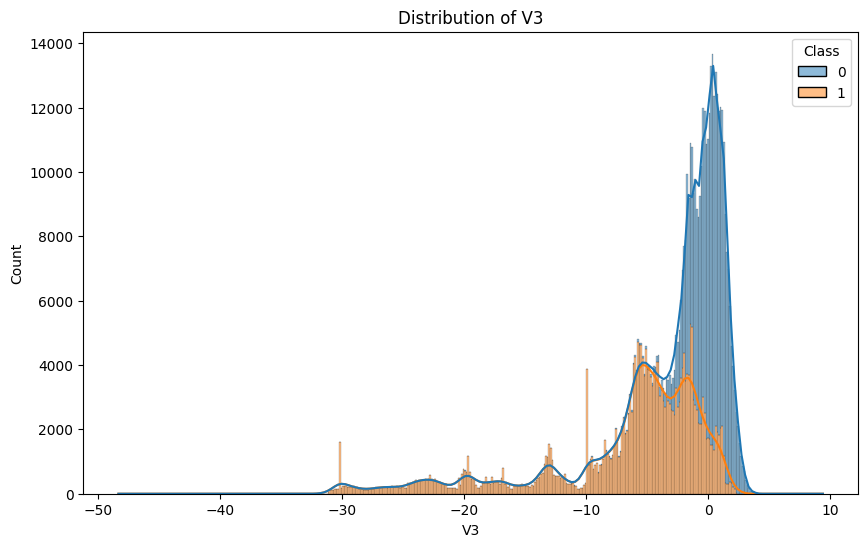

...

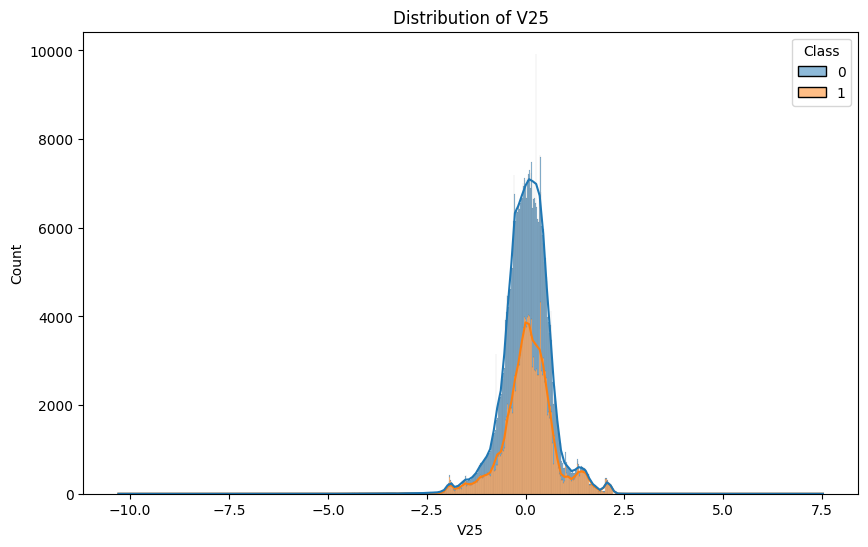

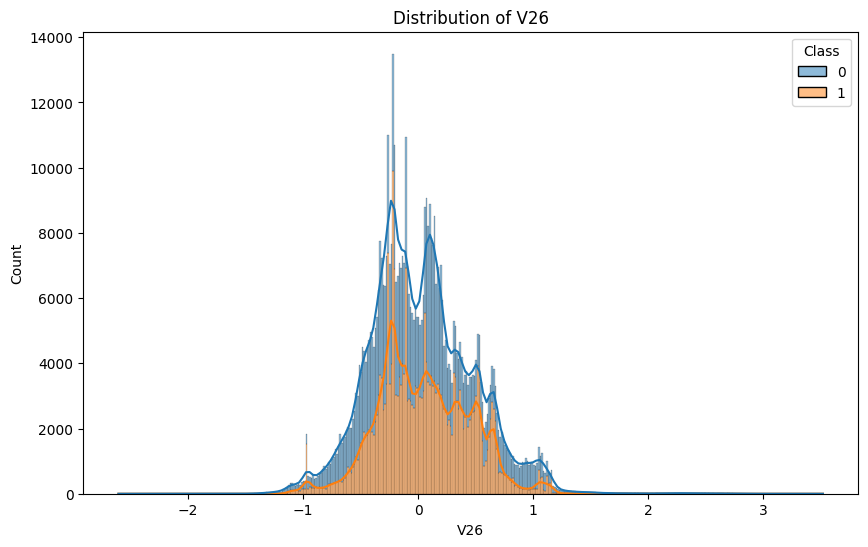

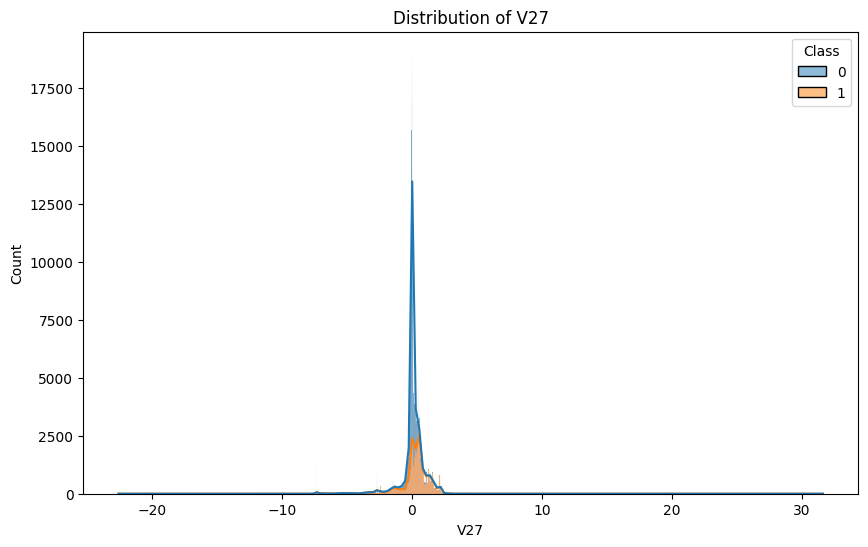

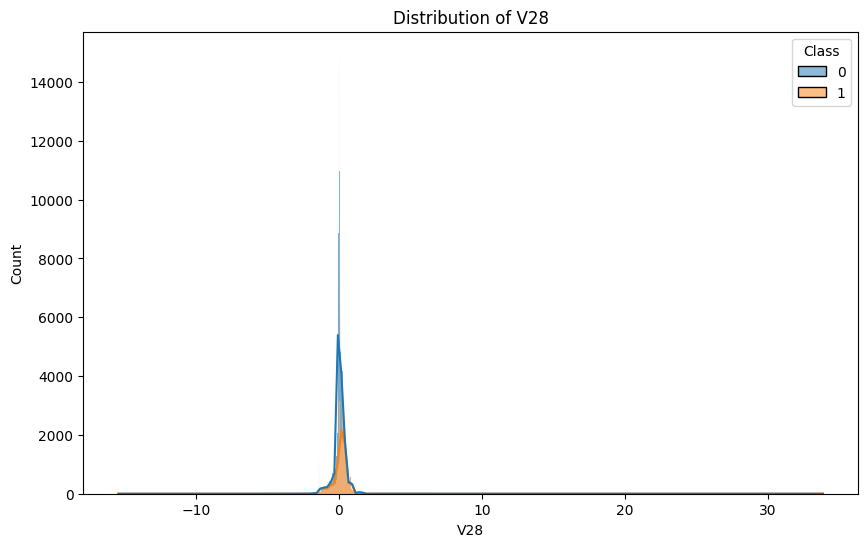

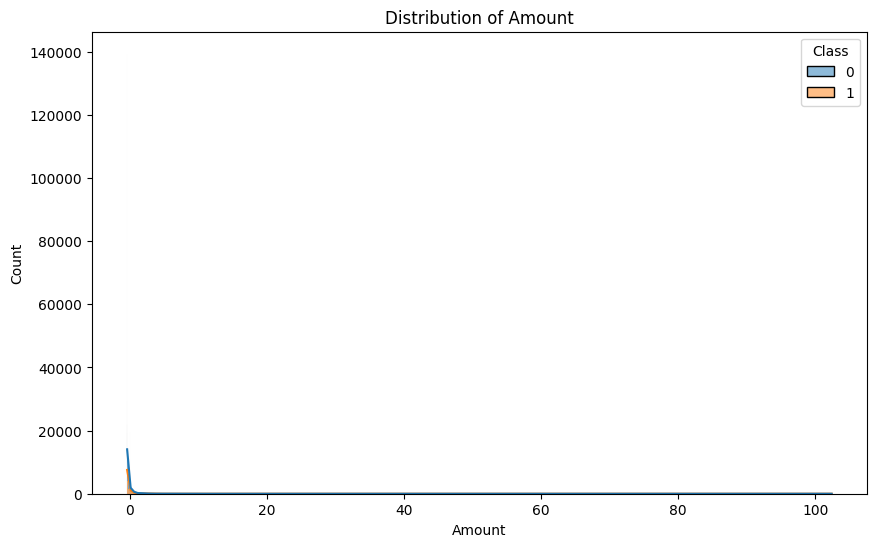

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

file_path = "E:\model2\creditcard_resampled.csv"
df = pd.read_csv(file_path)

print(df.info())
print(df.isnull().sum())

def plot_distribution(data, feature, target):
    plt.figure(figsize=(10, 6))
    sns.histplot(data=data, x=feature, hue=target, multiple="stack", kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

features = df.columns.drop('Class')

plt.figure(figsize=(18, 14))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

for feature in features:
    plot_distribution(df, feature, 'Class')



In [8]:
from flaml import AutoML
import pandas as pd
import re

# 定义目标变量名称并替换特殊字符
target_name = "Class"
replace_str = [':', '[', ']', '（', '）', '！', '＠', '＃', '￥', '％', '…', '《', '》', '【', '】', ' ']
for s in replace_str:
    target_name = target_name.replace(s, '_')

# 读取训练集和验证集数据
train = pd.read_csv("E:\\model2\\信用卡诈骗3_train.csv")
validation = pd.read_csv("E:\\model2\\信用卡诈骗3_validation.csv")
validation = validation[train.columns]

# 分割特征和目标变量
X_train, y_train = train.drop(columns=target_name), train[target_name]
X_val, y_val = validation.drop(columns=target_name), validation[target_name]

# 使用FLAML进行自动化机器学习
automl = AutoML()
settings = {
    "time_budget": 600,  # 设置运行时间预算为600秒
    "metric": 'accuracy',  # 设置评估指标为准确率
    "task": 'classification',  # 设置任务类型为分类
    "log_file_name": 'automl.log',  # 设置日志文件名
    "estimator_list": ['lgbm', 'xgboost', 'rf', 'extra_tree'],  # 设置使用的模型列表
    "eval_method": 'auto',  # 设置评估方法为自动
    "n_splits": 20,  # 设置交叉验证的折数为20
}

# 训练自动化模型
automl.fit(X_train=X_train, y_train=y_train, X_val=X_val, y_val=y_val, **settings)
print("-----------------")

# 打印日志文件中前200个模型的参数
def process_estimators():
    try:
        for i in range(1, 200):
            print(automl.get_estimator_from_log("automl.log", i, "classification"))
    except ValueError:
        return 0 

process_estimators()

[flaml.automl.logger: 06-20 15:34:09] {1679} INFO - task = classification
[flaml.automl.logger: 06-20 15:34:09] {1687} INFO - Data split method: stratified
[flaml.automl.logger: 06-20 15:34:09] {1690} INFO - Evaluation method: holdout
[flaml.automl.logger: 06-20 15:34:10] {1788} INFO - Minimizing error metric: 1-accuracy
[flaml.automl.logger: 06-20 15:34:10] {1900} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'rf', 'extra_tree']
[flaml.automl.logger: 06-20 15:34:10] {2218} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-20 15:34:10] {2344} INFO - Estimated sufficient time budget=68471s. Estimated necessary time budget=68s.
[flaml.automl.logger: 06-20 15:34:10] {2391} INFO -  at 8.2s,	estimator lgbm's best error=0.0565,	best estimator lgbm's best error=0.0565
[flaml.automl.logger: 06-20 15:34:10] {2218} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-20 15:34:10] {2391} INFO -  at 8.4s,	estimator lgbm's best error=0.0565,	best estimat

0

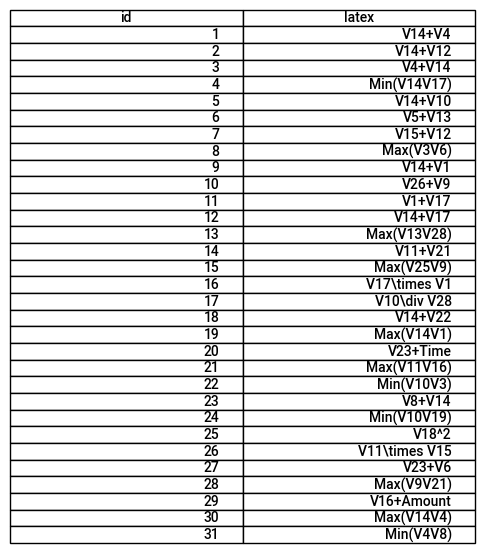

In [11]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

data = pd.read_csv("E:\creditcard4.csv")
X = data.drop(columns=['Class'])
y = data['Class']
scaler = StandardScaler()
X['Amount'] = scaler.fit_transform(X[['Amount']])
X['Time'] = scaler.fit_transform(X[['Time']])

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

data_resampled = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled, columns=['Class'])], axis=1)

data_resampled.to_csv(r"E:\model\creditcard_resampled.csv", index=False)

feature_file = pd.read_csv(r"E:\model2\features.csv")
automl_record = pd.read_csv(r"E:\model2\automl_record.csv")

plt.figure(figsize=(6, 3))
plt.table(cellText=feature_file.values, colLabels=feature_file.columns, loc='center')
plt.axis('off')  
plt.show()


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



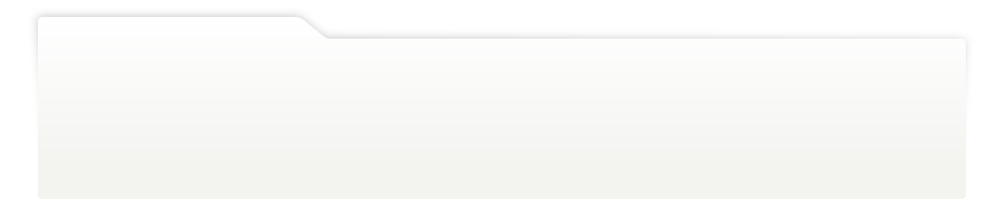
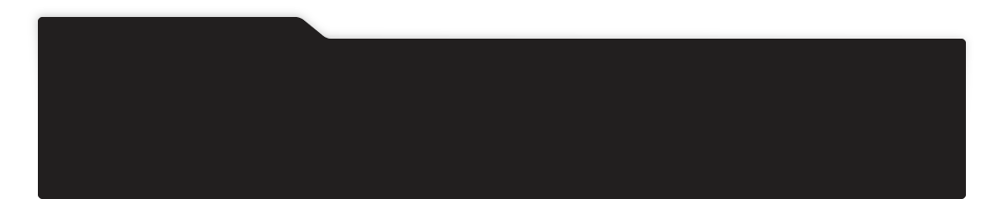
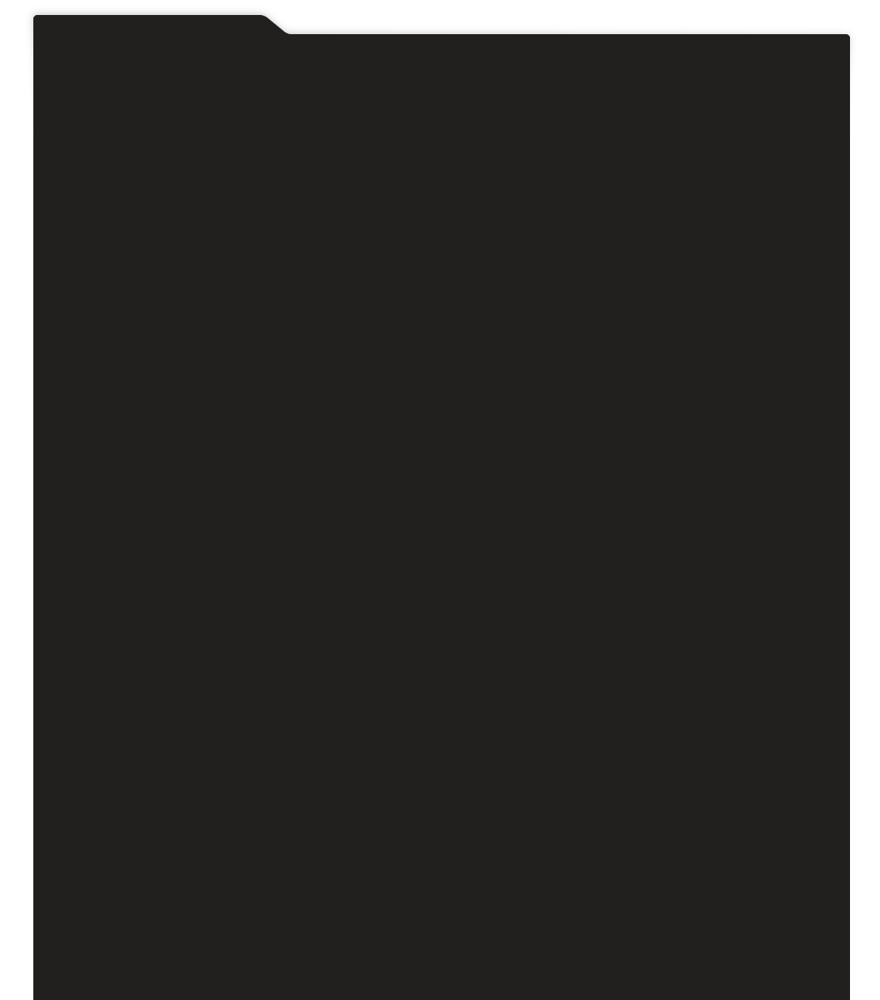
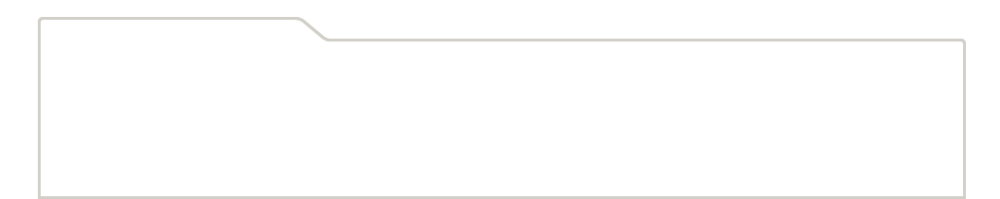
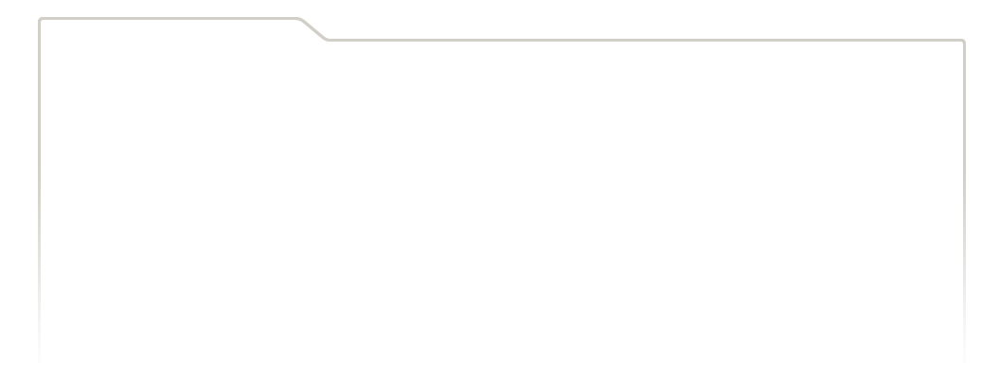
...
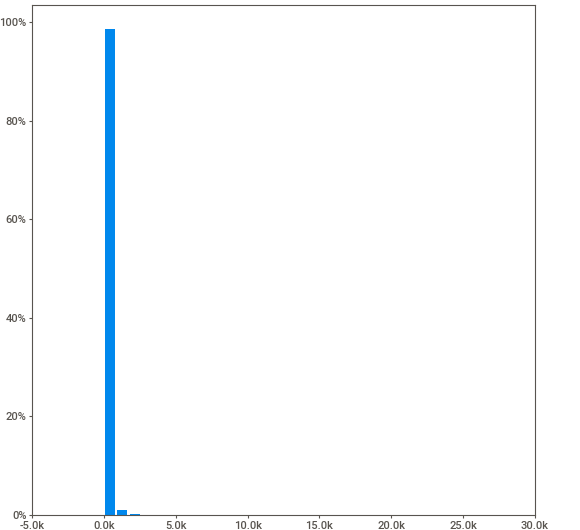
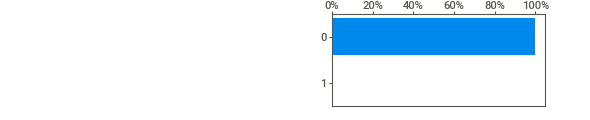
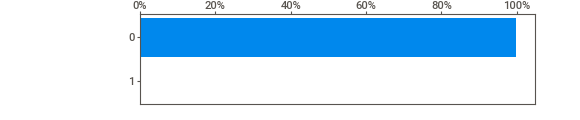
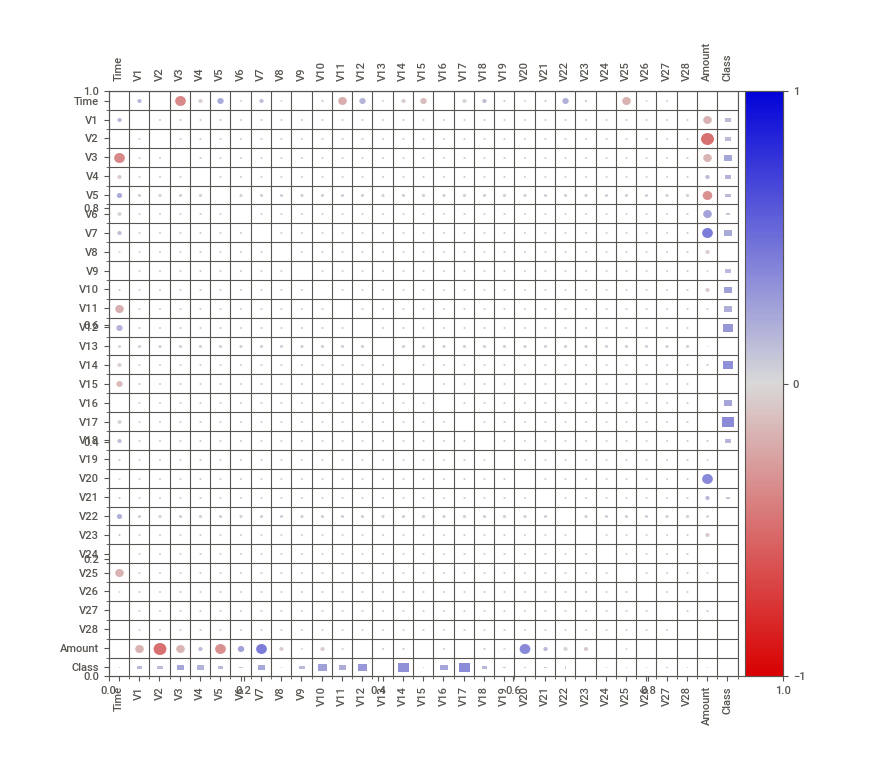
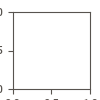

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



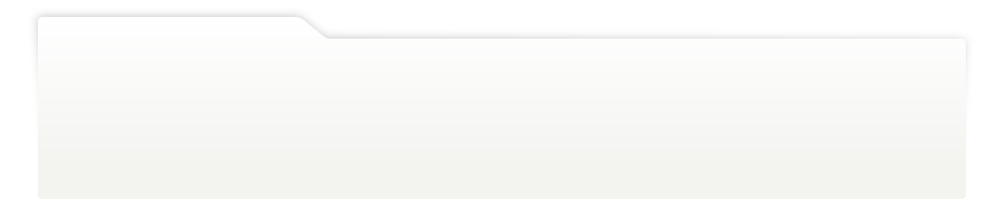
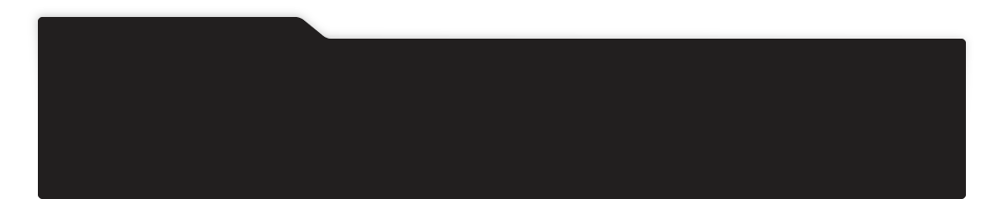
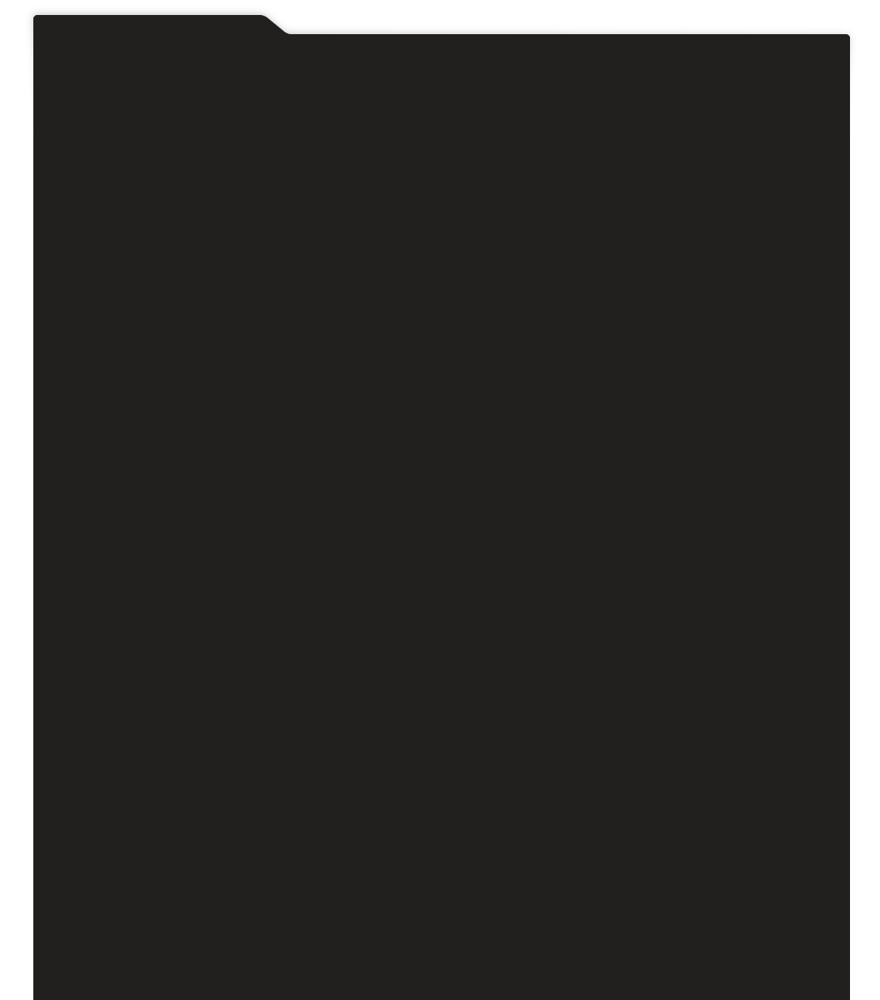
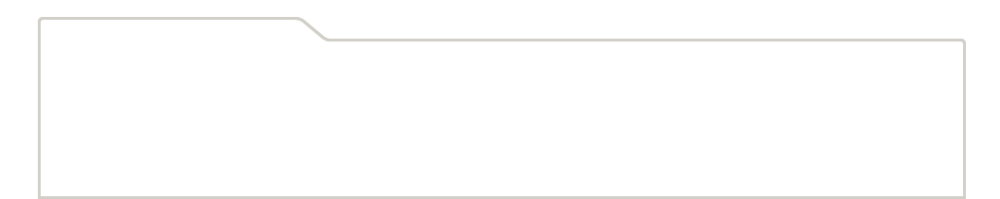
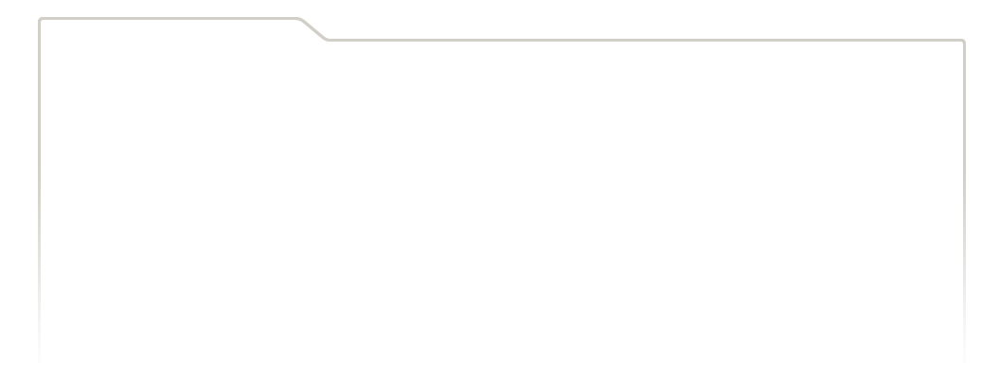
...
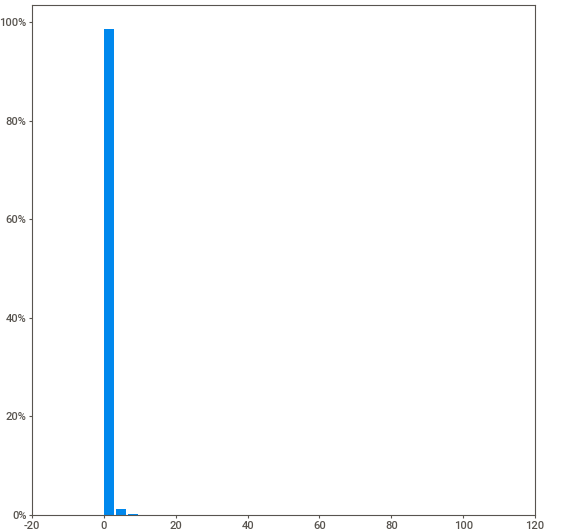
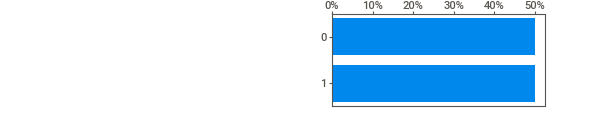
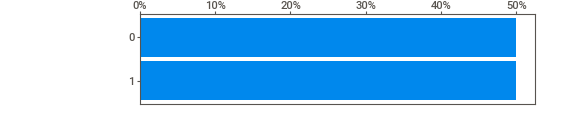
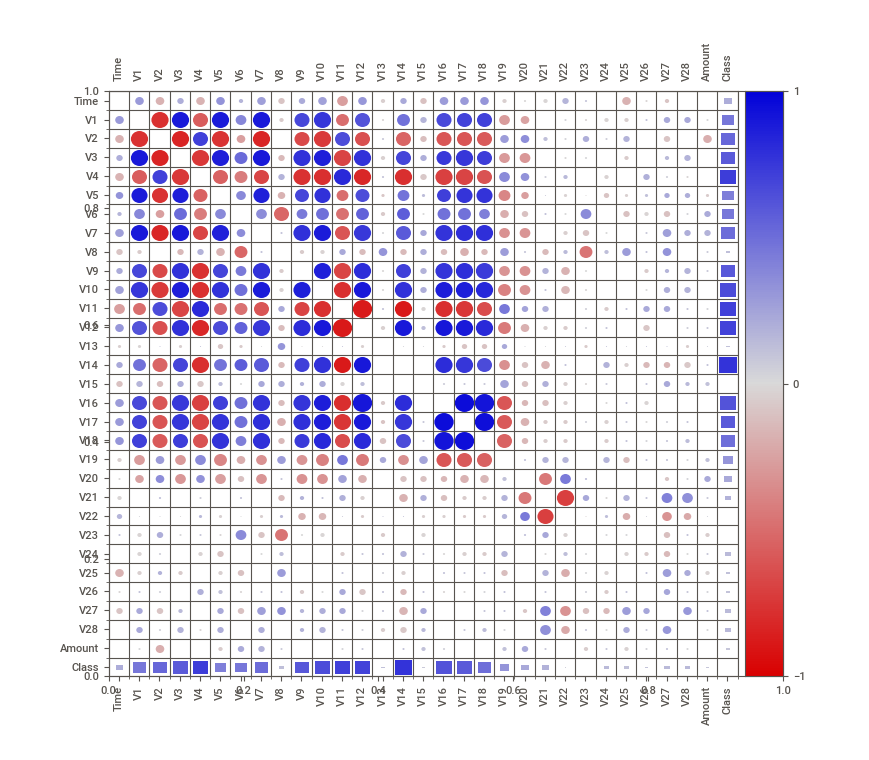
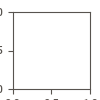

In [12]:
import sweetviz

data = pd.read_csv(r"E:\creditcard4.csv")
new_data = pd.read_csv(r"E:\model2\creditcard_resampled.csv")
report = sweetviz.analyze(data)
report.show_notebook()

new_report = sweetviz.analyze(new_data)
new_report.show_notebook()

